<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Import-Libraries-and-Data" data-toc-modified-id="Import-Libraries-and-Data-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Import Libraries and Data</a></span></li><li><span><a href="#Bar" data-toc-modified-id="Bar-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Bar</a></span><ul class="toc-item"><li><span><a href="#Horizontal-Bar" data-toc-modified-id="Horizontal-Bar-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Horizontal Bar</a></span></li><li><span><a href="#Stacked-Bar" data-toc-modified-id="Stacked-Bar-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Stacked Bar</a></span></li><li><span><a href="#Group-Bar" data-toc-modified-id="Group-Bar-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Group Bar</a></span></li></ul></li><li><span><a href="#Count-Plot" data-toc-modified-id="Count-Plot-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Count Plot</a></span></li><li><span><a href="#Histogram" data-toc-modified-id="Histogram-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Histogram</a></span><ul class="toc-item"><li><span><a href="#2d-Histogram" data-toc-modified-id="2d-Histogram-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>2d Histogram</a></span></li><li><span><a href="#Facet-Histogram" data-toc-modified-id="Facet-Histogram-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Facet Histogram</a></span></li></ul></li><li><span><a href="#Rel-Plot" data-toc-modified-id="Rel-Plot-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Rel Plot</a></span></li><li><span><a href="#Dist-Plot" data-toc-modified-id="Dist-Plot-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Dist Plot</a></span></li><li><span><a href="#Pie-Plot" data-toc-modified-id="Pie-Plot-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Pie Plot</a></span></li><li><span><a href="#Scatter-Plot" data-toc-modified-id="Scatter-Plot-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>Scatter Plot</a></span></li><li><span><a href="#Trend-Line" data-toc-modified-id="Trend-Line-9"><span class="toc-item-num">9&nbsp;&nbsp;</span>Trend Line</a></span></li></ul></div>

# Import Libraries and Data

In [41]:
# Import required libraries
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import pandas as pd 
import numpy as np
from pandas.api.types import CategoricalDtype
import matplotlib.pyplot as plt

In [10]:
diamonds = sns.load_dataset('diamonds')
df = diamonds.copy()
df.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype   
---  ------   --------------  -----   
 0   carat    53940 non-null  float64 
 1   cut      53940 non-null  category
 2   color    53940 non-null  category
 3   clarity  53940 non-null  category
 4   depth    53940 non-null  float64 
 5   table    53940 non-null  float64 
 6   price    53940 non-null  int64   
 7   x        53940 non-null  float64 
 8   y        53940 non-null  float64 
 9   z        53940 non-null  float64 
dtypes: category(3), float64(6), int64(1)
memory usage: 3.0 MB


In [12]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
carat,53940.0,0.797940,0.474011,0.2,0.40,0.70,1.04,5.01
depth,53940.0,61.749405,1.432621,43.0,61.00,61.80,62.50,79.00
table,53940.0,57.457184,2.234491,43.0,56.00,57.00,59.00,95.00
price,53940.0,3932.799722,3989.439738,326.0,950.00,2401.00,5324.25,18823.00
x,53940.0,5.731157,1.121761,0.0,4.71,5.70,6.54,10.74
y,53940.0,5.734526,1.142135,0.0,4.72,5.71,6.54,58.90
z,53940.0,3.538734,0.705699,0.0,2.91,3.53,4.04,31.80


In [14]:
cut_categories = ["Fair","Good","Very Good","Premium","Ideal"]
df.cut = df.cut.astype(CategoricalDtype(categories = cut_categories, ordered = True))
color_categories = ["G","E","H","F","D", "I","J"]
df.color = df.color.astype(CategoricalDtype(categories = color_categories, ordered = True))

In [15]:
df["color"].value_counts()

G    11292
E     9797
F     9542
H     8304
D     6775
I     5422
J     2808
Name: color, dtype: int64

# Bar 

In [17]:
dia

,cut,price
0,Fair,4358.757764
1,Good,3928.864452
2,Very Good,3981.759891
3,Premium,4584.257704
4,Ideal,3457.541970


In [19]:
dia = df.groupby(["cut"])[["price"]].mean().reset_index()
fig = px.bar(dia[['cut', 'price']].sort_values('price', ascending=False), 
             y="price", x="cut", color='cut', 
             log_y=True, template='ggplot2')
fig.show()

## Horizontal Bar

In [21]:
dia = df.groupby(["cut"])[["price"]].mean().reset_index()
fig = px.bar(dia[['cut', 'price']].sort_values('price', ascending=False), 
             y="cut", x="price", color='cut', 
             orientation="h")
fig.show()

## Stacked Bar

In [22]:
dia_cc = df.groupby(["cut","color"])[["price"]].mean().reset_index()
fig = px.bar(dia_cc, x="cut", y="price", color='color', barmode='stack',
             height=400)
fig.show()

## Group Bar

In [23]:
fig = px.bar(dia_cc, x="cut", y="price", color='color', barmode='group',
             height=400)
fig.show()

# Count Plot

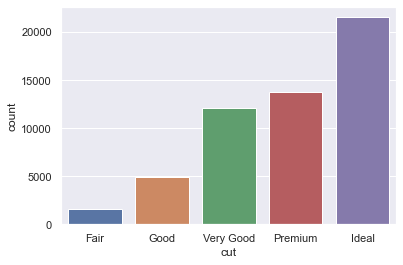

In [27]:
sns.set(style="darkgrid")
ax = sns.countplot(x="cut", data=df)

# Histogram

In [33]:
fig = px.histogram(df, x="price")
fig.show()

## 2d Histogram

In [35]:
fig = px.density_heatmap(df, x="cut", y="price")
fig.show()

## Facet Histogram

In [36]:
fig = px.density_heatmap(df, x="cut", y="price",facet_row="clarity")
fig.show()

# Rel Plot

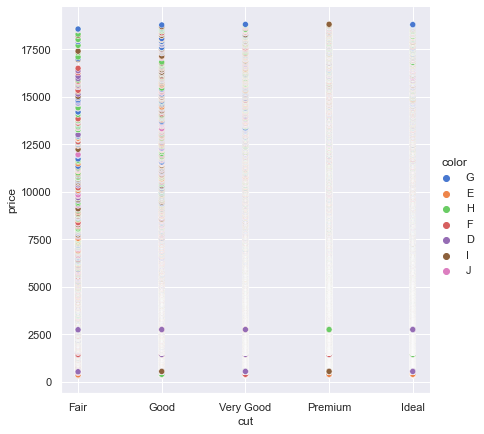

In [37]:
sns.relplot(x="cut", y="price", hue="color", palette="muted",
            height=6, data=df)

# Dist Plot

J:\java\Python\Anaconda\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='price', ylabel='Density'>

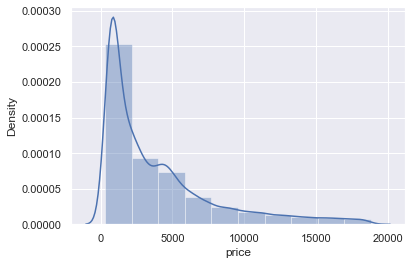

In [38]:
sns.distplot(df['price'], bins=10, kde=True)

# Pie Plot

In [39]:
dia_cp = df.groupby(["cut"])[["price"]].mean().reset_index()

fig = px.pie(dia_cp,
             values="price",
             names="cut",
             template="seaborn")
fig.update_traces(rotation=90, pull=0.05, textinfo="percent+label")
fig.show()

# Scatter Plot

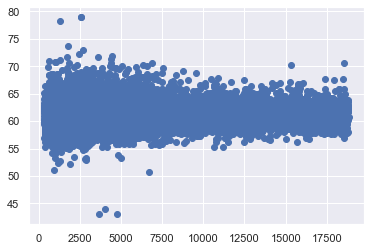

In [42]:
plt.scatter(df.price,df.depth)

# Trend Line

In [44]:
fig = px.scatter(df, x="table", y="depth", trendline="ols")
fig.show()